In [2]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage


In [4]:
# Question 1  (a) 

path = '/Users/eoghankealy/Desktop/python_ucd/final_project/'
# load in data with sep=';'as columns in file are separated by ;
red_df = pd.read_csv(path+ 'winequality-red.csv', sep=';')

print(red_df.head(10))




   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   
5            7.4              0.66         0.00             1.8      0.075   
6            7.9              0.60         0.06             1.6      0.069   
7            7.3              0.65         0.00             1.2      0.065   
8            7.8              0.58         0.02             2.0      0.073   
9            7.5              0.50         0.36             6.1      0.071   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0

In [6]:
# Question 1 (b)

# Number of wines
num_wines = len(red_df)
print(f"The dataset contains {num_wines} red wine samples.")

# Number of indicators
num_indicators = len(red_df.columns)
print(f"The dataset has {num_indicators} different indicators.")

# Check for missing values
has_missing = red_df.isnull().values.any()
if has_missing:
      print("The dataset contains missing values.")
else:
       print("The dataset does not contain any missing values.")

The dataset contains 1599 red wine samples.
The dataset has 12 different indicators.
The dataset does not contain any missing values.


In [8]:
# check for  duplicate rows in the dataframe
duplicate_rows = red_df[red_df.duplicated()]

# Display results
if not duplicate_rows.empty:
    print(f"Found {len(duplicate_rows)} duplicate rows in the dataframe:")
    print(duplicate_rows)
else:
    print("No duplicate rows were found in the dataframe.")

Found 240 duplicate rows in the dataframe:
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
4               7.4             0.700         0.00            1.90      0.076   
11              7.5             0.500         0.36            6.10      0.071   
27              7.9             0.430         0.21            1.60      0.106   
40              7.3             0.450         0.36            5.90      0.074   
65              7.2             0.725         0.05            4.65      0.086   
...             ...               ...          ...             ...        ...   
1563            7.2             0.695         0.13            2.00      0.076   
1564            7.2             0.695         0.13            2.00      0.076   
1567            7.2             0.695         0.13            2.00      0.076   
1581            6.2             0.560         0.09            1.70      0.053   
1596            6.3             0.510         0.13            2.30

In [ ]:
# 240 potential duplicates were found in the data for red wine so using the link 
# i found in the wine.txt file (http://dx.doi.org/10.1016/j.dss.2009.05.016)
# i looked at the  origional paper that first used the data. The paper states that 
# there are 1599 red wine samples and 4898 white wine samples. The 1599 sample figure matches 
# with the 1599 samples i have found in the red wine data so it seems if they are duplicates 
# the origional paper decided to use them intentionally , and therefore so will I. I will check the white wine samples later.
# Perhaps the duplicate rows might reflect multiple measurements of the same wine 
# or wines with very similar properties, which is valuable data in its own right.

In [10]:
# Question 1 (c)

print(red_df.describe())


       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1599.000000       1599.000000  1599.000000     1599.000000   
mean        8.319637          0.527821     0.270976        2.538806   
std         1.741096          0.179060     0.194801        1.409928   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.390000     0.090000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.420000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1599.000000          1599.000000           1599.000000  1599.000000   
mean      0.087467            15.874922             46.467792     0.996747   
std       0.047065            10.460157             32.895324     0.001887   
min       0.012000             1.000000         

In [ ]:


# Quality Distribution:


# Quality scores range from 3 (poorest) to 8 (best) on a scale of 0-10
# Average quality is 5.64 with a standard deviation of 0.81
# Most wines fall between 5 (25th percentile) and 6 (75th percentile)
# This suggests most wines are of average to slightly above average quality

# Fixed Acidity:

# Ranges from 4.6 to 15.9 with mean of 8.32

# Alcohol Content:

# Ranges from 8.4% to 14.9% with mean of 10.42%
# Most wines fall between 9.5% and 11.1% alcohol


# pH Levels:

# Range from 2.74 to 4.01
# Mean of 3.31 with small std dev (0.15)


# Sulfur Dioxide shows high variability:

# Total sulfur dioxide ranges from 6 to 289
# Free sulfur dioxide ranges from 1 to 72
# Large standard deviations indicate wide variation in amount of sulfur used 
# (sulphur is use to kill bacteria and yeast and prevent oxidaisation)


# Density:

# Very consistent across wines (0.99007 to 1.00369)
# Small standard deviation (0.001887)



# Residual sugar has some extreme high values (max 15.5 vs median 2.2)
# Chlorides show some outliers (max 0.611 vs median 0.079)






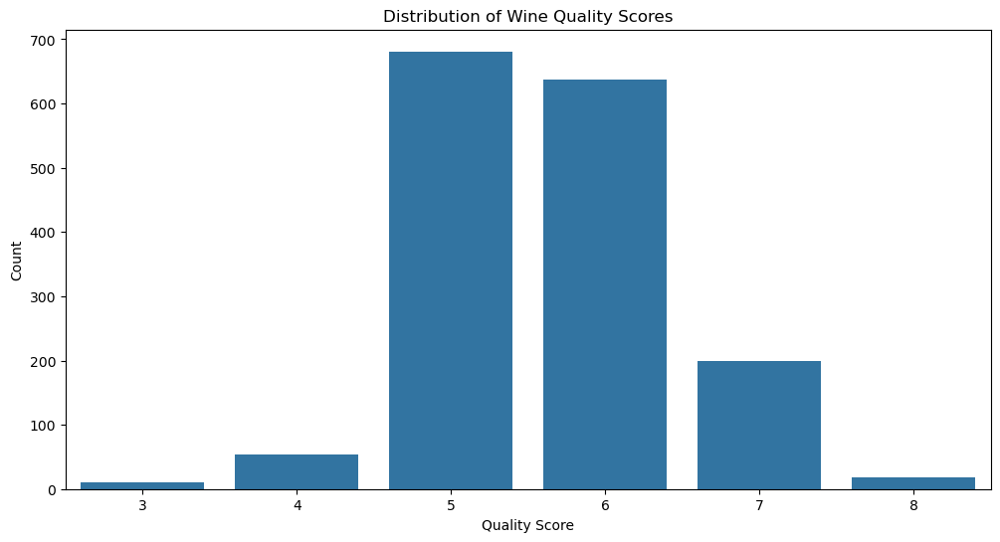

In [12]:
# count plot

plt.figure(figsize=(12, 6))
sns.countplot(x='quality', data=red_df)
plt.title('Distribution of Wine Quality Scores')
plt.xlabel('Quality Score')
plt.ylabel('Count')
plt.show()

In [ ]:
# Most of the red wines fall into the mid range 5 and 6 quality  with the distrubutiaon slightly 
# skewed towards higher quality wines; 7 & 8 range being much higher 
# than the lower quality 3 & 4 range

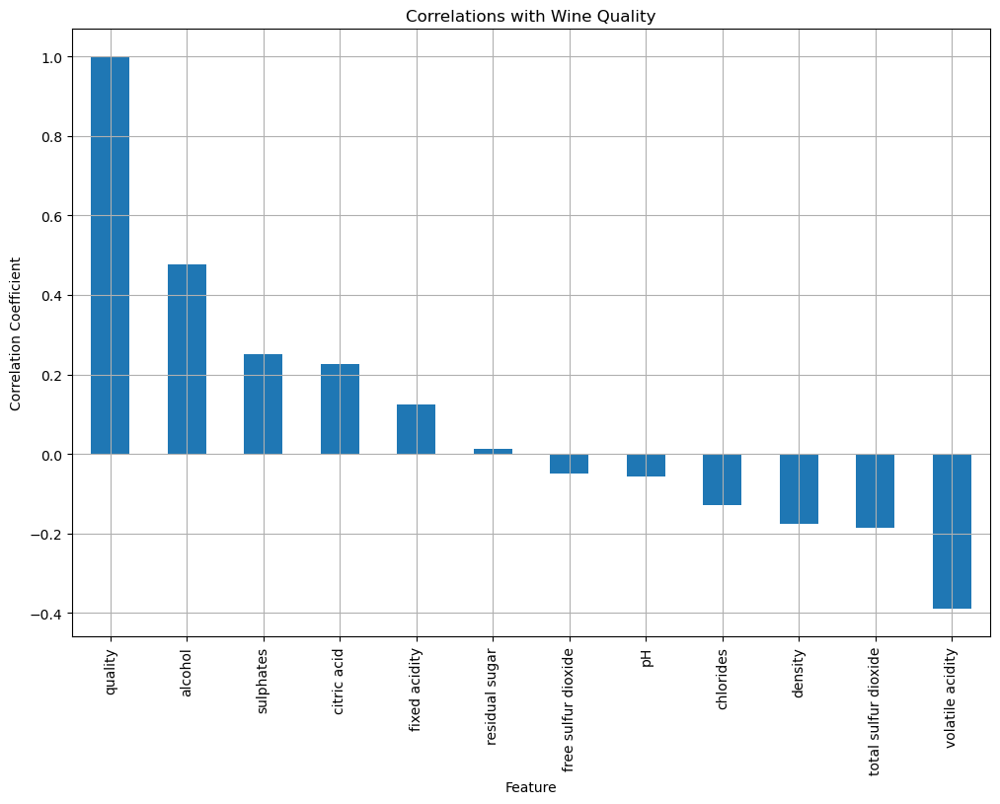

In [14]:
# Correlation between features and quality
quality_correlations = red_df.corr()['quality']

# Sort the correlations in descending order
quality_correlations = quality_correlations.sort_values(ascending=False)

# Plot the correlations as a bar chart
plt.figure(figsize=(12, 8))
quality_correlations.plot(kind='bar')
plt.title("Correlations with Wine Quality")
plt.xlabel("Feature")
plt.ylabel("Correlation Coefficient")
plt.grid(True)
plt.show()

In [ ]:

# I have decided to concentrate on the correlation bewteen the different features and Quality 
# as many of the features have  obvious correlations such as the high correlation between
# sulfur dioxide and total sulfur dioxide, fixed acidty and citric acid or acidity and pH


# Quality Correlations (most important for wine quality prediction):


# Strongest positive: Alcohol (0.48)
# Strongest negative: Volatile acidity (-0.39)
# Moderate positive: Sulphates (0.25)
# Most features have relatively weak correlations with quality (below 0.3)


# These insights suggest that alcohol content and volatile acidity might be the most 
# important predictors of red wine quality, while some features like residual sugar might be 
# less influential in determining quality.

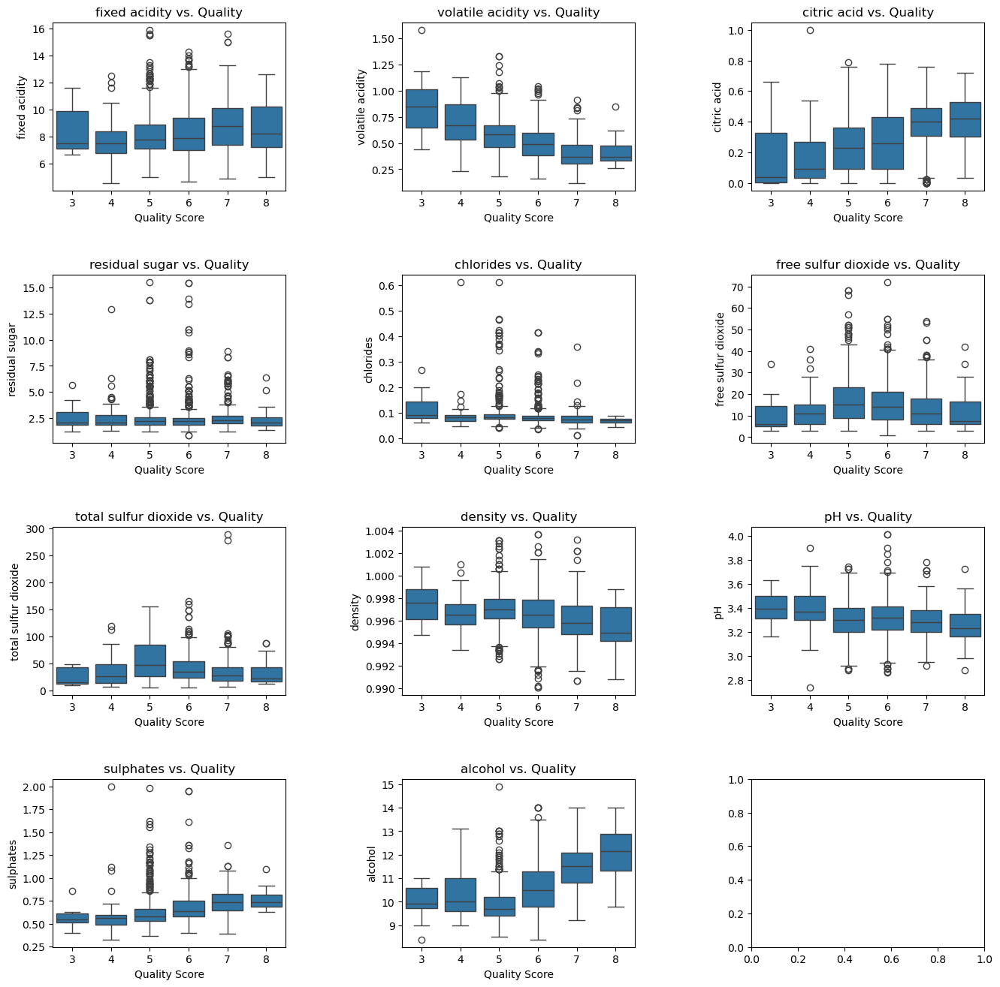

In [16]:
# Boxplots for Features vs. Quality

# create 4 x 3 subplot grid

fig, axes = plt.subplots(4, 3, figsize=(16, 16))
axes = axes.flatten()

# list of features (columns) in dataframe
features_to_plot = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 
                   'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 
                   'pH', 'sulphates', 'alcohol']


# loop through features
for i, feature in enumerate(features_to_plot):
        sns.boxplot(x='quality', y=feature, data=red_df, ax=axes[i])
        axes[i].set_title(f"{feature} vs. Quality")
        axes[i].set_xlabel("Quality Score")
        axes[i].set_ylabel(feature)
    
        
# adjust spacing between subplots
plt.subplots_adjust(wspace=0.5, hspace=0.5)
plt.show()

In [ ]:

# Key observations: 

# Volatile Acidity vs. Quality:

# Higher volatile acidity is linked to lower quality wines, with clearly negative correlation
# Also Higher-quality wines (7 and 8) show smaller interquartile ranges, 
# indicating more consistency in volatile acidity levels.


# Citric Acid vs. Quality:

# There appears to be an optimal range of citric acid for quality, with the highest quality wines having moderate citric acid levels 
# and having  smaller interquartile ranges.



# Sulphates vs. Quality:

# Sulphate levels exhibit a clear positive correlation with wine quality, with higher sulphates linked to higher quality scores.


# Alcohol vs. Quality:

# Alcohol content has a strong positive correlation with quality, with higher alcohol wines generally receiving better quality ratings.



# In summary, the key features that seem to positively influence red wine quality are alcohol content, 
# sulphates, and moderate levels of citric acid. 
# Conversely volatile acidity  appears to be undesirable for quality. 


In [18]:
# Question 2  (a)

# load in data with sep=';'as columns in file are separated by ;
white_df = pd.read_csv(path+ 'winequality-white.csv', sep=';')

print(red_df.head(10))





   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   
5            7.4              0.66         0.00             1.8      0.075   
6            7.9              0.60         0.06             1.6      0.069   
7            7.3              0.65         0.00             1.2      0.065   
8            7.8              0.58         0.02             2.0      0.073   
9            7.5              0.50         0.36             6.1      0.071   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0

In [20]:
# Question 2 (b)

# check for  duplicate rows in the dataframe
duplicate_rows = white_df[white_df.duplicated()]

# Display results
if not duplicate_rows.empty:
    print(f"Found {len(duplicate_rows)} duplicate rows in the dataframe:")
    print(duplicate_rows)
else:
    print("No duplicate rows were found in the dataframe.")

Found 937 duplicate rows in the dataframe:
      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
4               7.2              0.23         0.32             8.5      0.058   
5               8.1              0.28         0.40             6.9      0.050   
7               7.0              0.27         0.36            20.7      0.045   
8               6.3              0.30         0.34             1.6      0.049   
20              6.2              0.66         0.48             1.2      0.029   
...             ...               ...          ...             ...        ...   
4828            6.4              0.23         0.35            10.3      0.042   
4850            7.0              0.36         0.35             2.5      0.048   
4851            6.4              0.33         0.44             8.9      0.055   
4856            7.1              0.23         0.39            13.7      0.058   
4880            6.6              0.34         0.40             8.1

In [22]:
# Duplicates appear to be found in the white wine samples  but again the figure of 
# 4898 samples in the orgional paper matches the number of rows in the white wine dataset
# so i will not remove them from the dataset as the paper appeared happy to consider all 4898 samples

In [22]:


# Number of wines
num_wines = len(white_df)
print(f"The dataset contains {num_wines} white wine samples.")

# Number of indicators
num_indicators = len(white_df.columns)
print(f"The dataset has {num_indicators} different indicators.")

# Check for missing values
has_missing = white_df.isnull().values.any()
if has_missing:
      print("The dataset contains missing values.")
else:
       print("The dataset does not contain any missing values.")

# Compare column names between red_df and white_df to see if they have the same indicators

common_columns = set(red_df.columns).intersection(set(white_df.columns))
missing_in_red_df = set(white_df.columns) - set(red_df.columns)
missing_in_white_df = set(red_df.columns) - set(white_df.columns)

# Results
if common_columns == set(red_df.columns) == set(white_df.columns):
    print("Both datasets have exactly the same indicators.")
else:
    print("The indicators are not the same between the datasets.")
    if missing_in_red_df:
        print(f"Columns present in white_df but missing in red_df: {missing_in_red_df}")
    if missing_in_white_df:
        print(f"Columns present in red_df but missing in white_df: {missing_in_white_df}")

The dataset contains 4898 white wine samples.
The dataset has 12 different indicators.
The dataset does not contain any missing values.
Both datasets have exactly the same indicators.


In [24]:
# Find rows in red_df that match rows in white_df
matching_rows = red_df.merge(white_df, how='inner')

# Display results
if not matching_rows.empty:
    print(f"Found {len(matching_rows)} matching rows between the two datasets:")
    print(matching_rows)
else:
    print("No matching rows were found between the two datasets.")

Found 3 matching rows between the two datasets:
   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            6.7              0.28         0.28             2.4      0.012   
1            6.7              0.28         0.28             2.4      0.012   
2            5.9              0.19         0.21             1.7      0.045   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 36.0                 100.0  0.99064  3.26       0.39   
1                 36.0                 100.0  0.99064  3.26       0.39   
2                 57.0                 135.0  0.99341  3.32       0.44   

   alcohol  quality  
0     11.7        7  
1     11.7        7  
2      9.5        5  


In [ ]:
# There are 3 mathcing rows between the two datasets, as the number of rows in both 
# the red and white wine samples matches  with the number of samples in the orgional paper
# i have decided to leave them in the data, as the paper appeared happy to use all smaples  and 
# 3 rows from a total of 1599 red and 4898 white should not affect the outcome of any analysis 
# by a large degree.

In [26]:
# Question 2 (c)



from scipy.stats import ttest_ind

# Ensure red_df and white_df have the same columns
common_columns = [col for col in red_df.columns if col in white_df.columns]

# Initialize a results dictionary to store t-scores and p-values
results = {}

# Perform t-tests for each common column (excluding 'quality' if needed)
for column in common_columns:
    # Perform an independent t-test
    t_stat, p_value = ttest_ind(red_df[column], white_df[column], equal_var=False)  # Use Welch's t-test
    
    # Store the results
    results[column] = {'t-statistic': t_stat, 'p-value': p_value}

# Display the results
print("T-test results (α = 0.01):")
print("{:<25} {:<15} {:<15} {:<15}".format("Measurement", "T-statistic", "P-value", "Conclusion"))
for column, stats in results.items():
    conclusion = "Reject H0" if stats['p-value'] < 0.01 else "Fail to Reject H0"
    print(f"{column:<25} {stats['t-statistic']:<15.4f} {stats['p-value']:<15.4e} {conclusion}")

# Interpretation: Iterate through and explain significant differences
significant_columns = [col for col, stats in results.items() if stats['p-value'] < 0.01]

print("\nSummary:")
if significant_columns:
    print("The following indicators show statistically significant differences between red and white wine samples at α = 0.01:")
    print(", ".join(significant_columns))
else:
    print("No indicators show statistically significant differences at α = 0.01.")


T-test results (α = 0.01):
Measurement               T-statistic     P-value         Conclusion     
fixed acidity             32.4227         5.6682e-183     Reject H0
volatile acidity          53.0591         0.0000e+00      Reject H0
citric acid               -12.2290        3.1730e-33      Reject H0
residual sugar            -47.8022        0.0000e+00      Reject H0
chlorides                 34.2402         6.0948e-199     Reject H0
free sulfur dioxide       -54.4279        0.0000e+00      Reject H0
total sulfur dioxide      -89.8721        0.0000e+00      Reject H0
density                   42.7085         0.0000e+00      Reject H0
pH                        27.7755         2.3423e-149     Reject H0
sulphates                 37.0559         1.6788e-231     Reject H0
alcohol                   -2.8590         4.2778e-03      Reject H0
quality                   -10.1494        8.1683e-24      Reject H0

Summary:
The following indicators show statistically significant differences betwe

In [ ]:

# All the indicators show significant differences between the red and white samples with statsitically significant p values
# the white wine samples appear to have more citric acid, residual sugar, sulfur dioxide 
# and interestingley get higher qulity scores. This would make sense as white wine genrally 
# uses more sulfur dioxide than red to preserve it (red wines tanins  help preserve it better) and 
# would also generally have higher residual sugar. The higher quality score for white may be due to the fact that vinho verde 
# is more renowend for white wines.


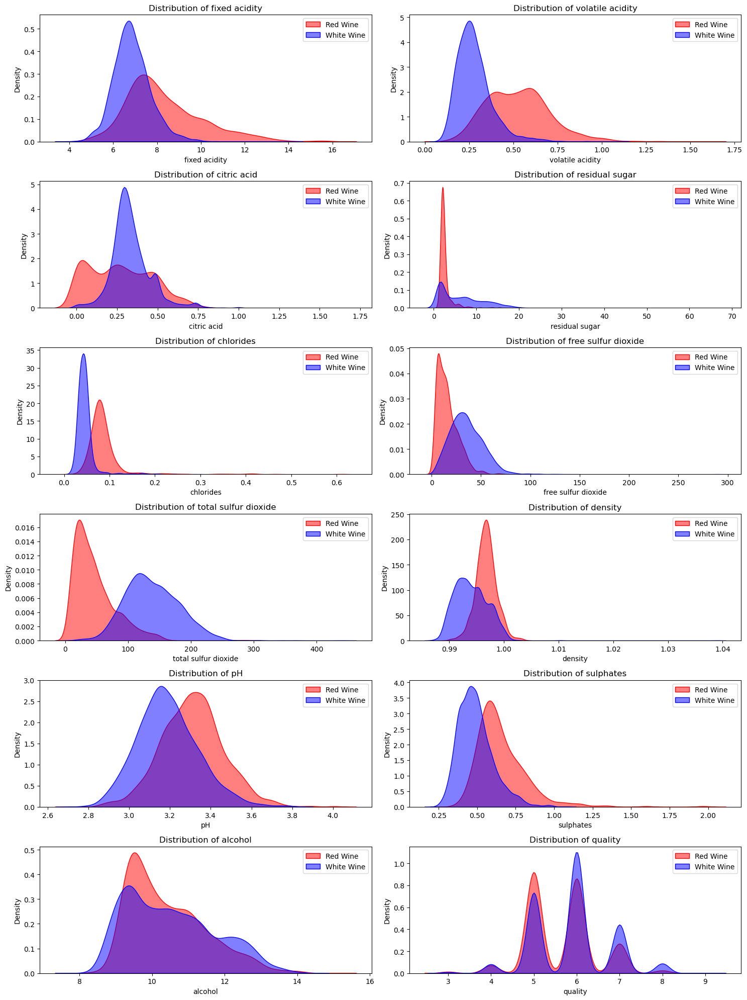

In [28]:
# Question 2 (d) 

# Define the features to compare
features_to_compare = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 
                       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density', 
                       'pH', 'sulphates', 'alcohol', 'quality']

# Set up the overall layout for comparison
plt.figure(figsize=(15, 20))

# Loop through each feature and kde plot comparisons
for i, feature in enumerate(features_to_compare):
    plt.subplot(6, 2, i+1)  # Create a grid of subplots (6 rows x 2 columns)
    sns.kdeplot(data=red_df[feature], label='Red Wine', color='red', fill=True, alpha=0.5)
    sns.kdeplot(data=white_df[feature], label='White Wine', color='blue', fill=True, alpha=0.5)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')
    plt.legend()

plt.tight_layout()
plt.show()



In [ ]:
# From the kde plots we can see the distrubuiton of the various indicators: 
# The red wine tends to have higher volatile acidity,pH and clorides. It has wider ranges for 
# fixed acidity and volatile acidity. And has multiple peaks for volatile acidity and citric acid 
# indicating multiple similar values or clustering 

# White wine samples have higher sulfur dioxide,smaller ranges for citric acid and fixed acidity 
# anda much wider range for residual sugar

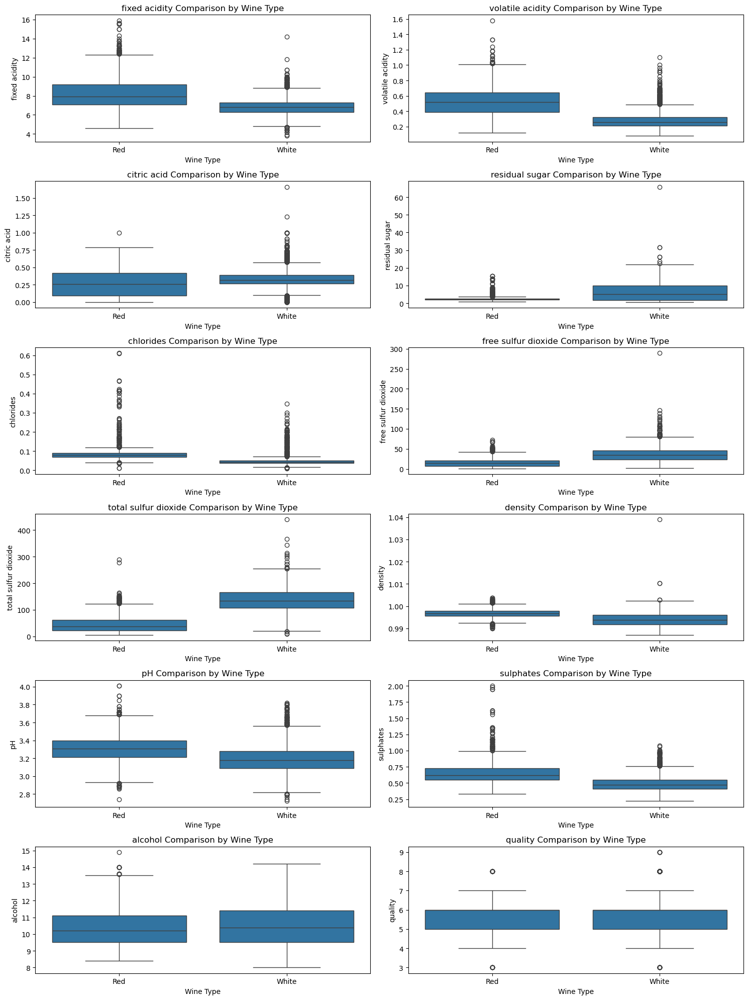

In [30]:

# Create boxplots for side-by-side comparisons
plt.figure(figsize=(15, 20))

# loop through each feature
for i, feature in enumerate(features_to_compare):
    plt.subplot(6, 2, i+1)
    sns.boxplot(x='wine_type', y=feature, data=pd.concat([red_df.assign(wine_type='Red'),
                                                          white_df.assign(wine_type='White')]))
    plt.title(f'{feature} Comparison by Wine Type')
    plt.xlabel('Wine Type')
    plt.ylabel(feature)

plt.tight_layout()
plt.show()

In [ ]:

# From the boxplots it can be seen that red wines have higher fixed acidity, volatile acidity, chlorides and pH compared to white wines.
# White wines have higher citric acid and  residual sugar
# There is significant overlap in the ranges for many of  indicators between the two wine types.
# The white wines have some higher outliers for quality



In [32]:
# Question 3 (a)


# Combine the two datsets red_df and white_df
wine_df = pd.concat([red_df, white_df], ignore_index=True)

# check number or rows  is equal to  6497 (1599 red  plus 4898 white)
print (len(wine_df))


6497


In [34]:
# Question 3 (b) 


# Calculate the Pearson correlation matrix
corr_matrix = wine_df.corr(method='pearson')

# Print the correlation matrix
print(corr_matrix)



# Find the top 8 strongest correlations, excluding 1.0 as they are correlated to themselves
# This will give me 8 results but 4 combinations as both sides of the pair is repeated
# sorting the values in abs (absolute) so positvie and negative are counted
top_correlations = corr_matrix.unstack()
top_correlations = top_correlations[top_correlations != 1.0].sort_values(key=abs, ascending=False)[:8]

# Print the results
print(top_correlations)

                      fixed acidity  volatile acidity  citric acid  \
fixed acidity              1.000000          0.219008     0.324436   
volatile acidity           0.219008          1.000000    -0.377981   
citric acid                0.324436         -0.377981     1.000000   
residual sugar            -0.111981         -0.196011     0.142451   
chlorides                  0.298195          0.377124     0.038998   
free sulfur dioxide       -0.282735         -0.352557     0.133126   
total sulfur dioxide      -0.329054         -0.414476     0.195242   
density                    0.458910          0.271296     0.096154   
pH                        -0.252700          0.261454    -0.329808   
sulphates                  0.299568          0.225984     0.056197   
alcohol                   -0.095452         -0.037640    -0.010493   
quality                   -0.076743         -0.265699     0.085532   

                      residual sugar  chlorides  free sulfur dioxide  \
fixed acidity    

In [50]:
# From the Pearson Correlation Matrix we can see that the 4 most strongly correlated pairs are

# 1. total sulfur dioxide and free sulfur dioxide
# 2. alcohol and density
# 3. residual sugar and density
# 4. total sulfur dioxide and residual sugar



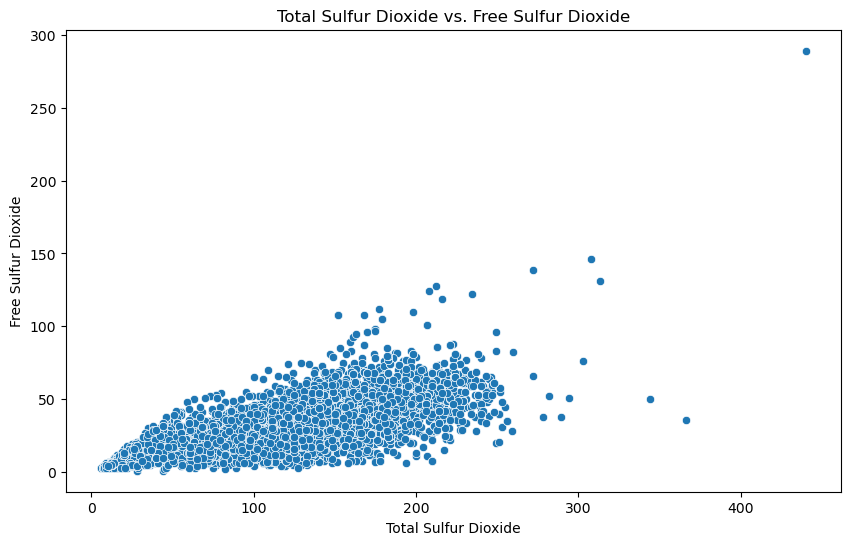

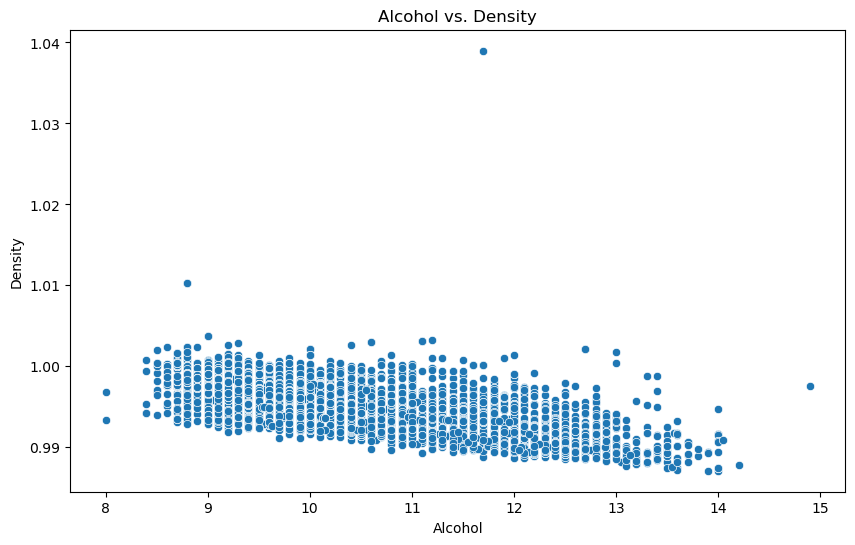

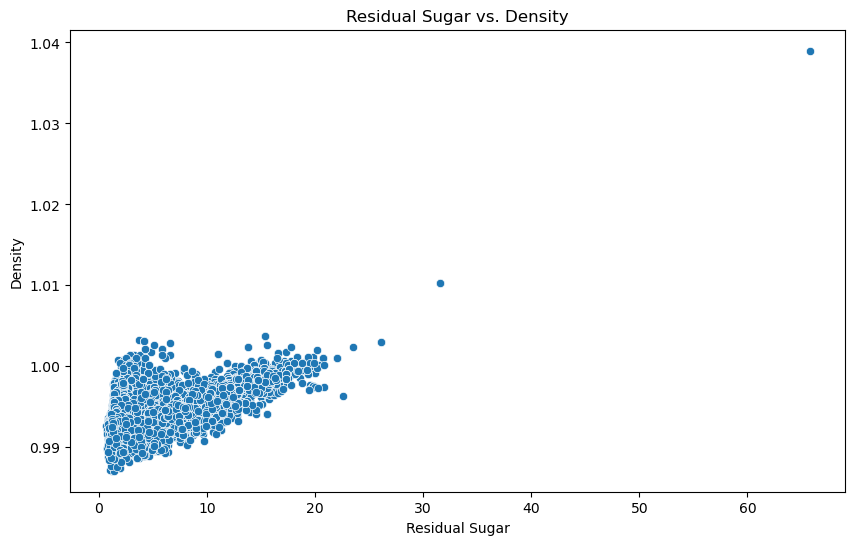

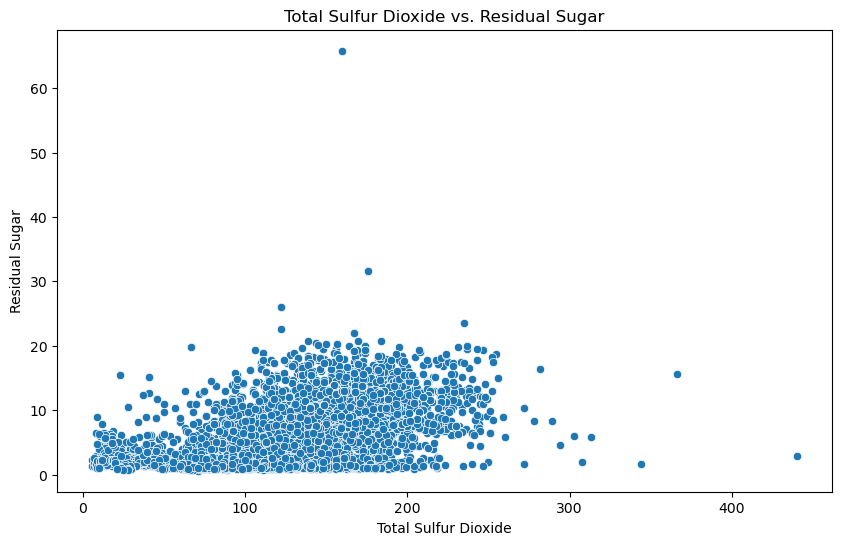

In [36]:
 # Question 3 (c) 

# 1. Total Sulfur Dioxide vs. Free Sulfur Dioxide
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total sulfur dioxide', y='free sulfur dioxide', data=wine_df)
plt.title('Total Sulfur Dioxide vs. Free Sulfur Dioxide')
plt.xlabel('Total Sulfur Dioxide')
plt.ylabel('Free Sulfur Dioxide')
plt.show()

# 2. Alcohol vs. Density
plt.figure(figsize=(10, 6))
sns.scatterplot(x='alcohol', y='density', data=wine_df)
plt.title('Alcohol vs. Density')
plt.xlabel('Alcohol')
plt.ylabel('Density')
plt.show()

# 3. Residual Sugar vs. Density
plt.figure(figsize=(10, 6))
sns.scatterplot(x='residual sugar', y='density', data=wine_df)
plt.title('Residual Sugar vs. Density')
plt.xlabel('Residual Sugar')
plt.ylabel('Density')
plt.show()

# 4. Total Sulfur Dioxide vs. Residual Sugar
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total sulfur dioxide', y='residual sugar', data=wine_df)
plt.title('Total Sulfur Dioxide vs. Residual Sugar')
plt.xlabel('Total Sulfur Dioxide')
plt.ylabel('Residual Sugar')
plt.show()

In [ ]:

# Findings:

# Total Sulfur Dioxide and Free Sulfur Dioxide 

# The Pearson correlation coefficient of 0.720934 indicates a moderate to strong positive correlation 
# between Total Sulfur Dioxide and Free Sulfur Dioxide in wine. This positive correlation 
# is shown in the scatterplot As Total Sulfur Dioxide increases, Free Sulfur Dioxide also tends to increase.
# However, the relationship is not perfectly linear, and there is a significant amount of scatter in the data.

# Alcohol and Density

# The scatter plot shows a moderate negative correlation between Alcohol and Density. 
# This means that as the Alcohol content increases, the Density tends to decrease.
# The Pearson correlation coefficient of -0.686745 (moderate correlation) confirms this relationship.


# Residual Sugar and Density

# The scatter plot shows a moderate positive correlation between Residual Sugar and Density. 
# This means that as the Residual Sugar content increases, the Density tends to increase as well.
# The Pearson correlation coefficient of 0.552517 (moderate) confirms this relationship.


# Residual sugar and Total sulfur dioxide 

# The scatter plot shows a moderate positive correlation between Residual Sugar and Total Sulfur Dioxide. 
# This means that as the Residual Sugar content increases, the Total Sulfur Dioxide tends to increase as well.
# The Pearson correlation coefficient of 0.495482 (moderate) confirms this relationship, however there is a sigificant 
# amount of scatter in the data




In [40]:
 # Question 4 (a) 


# create a function to classify each row of quality column
def classify_wine(quality):
    if quality <= 5:
        return "POOR"
    else:
        return "GOOD"

wine_class_df = wine_df.copy()  # Create a copy of the original DataFrame
wine_class_df['quality_class'] = wine_class_df['quality'].apply(classify_wine)

print(wine_class_df.head(10))


   fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0            7.4              0.70         0.00             1.9      0.076   
1            7.8              0.88         0.00             2.6      0.098   
2            7.8              0.76         0.04             2.3      0.092   
3           11.2              0.28         0.56             1.9      0.075   
4            7.4              0.70         0.00             1.9      0.076   
5            7.4              0.66         0.00             1.8      0.075   
6            7.9              0.60         0.06             1.6      0.069   
7            7.3              0.65         0.00             1.2      0.065   
8            7.8              0.58         0.02             2.0      0.073   
9            7.5              0.50         0.36             6.1      0.071   

   free sulfur dioxide  total sulfur dioxide  density    pH  sulphates  \
0                 11.0                  34.0   0.9978  3.51       0

In [44]:
# Question 4 (b) 


# Separate response and predictor variables
X = wine_df.drop('quality', axis=1)  # Predictor variables
y = wine_df['quality']  # Response variable

# Standardize predictor variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Create a new DataFrame with standardized predictors
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

print(X_scaled_df)


      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0          0.142473          2.188833    -2.192833       -0.744778   0.569958   
1          0.451036          3.282235    -2.192833       -0.597640   1.197975   
2          0.451036          2.553300    -1.917553       -0.660699   1.026697   
3          3.073817         -0.362438     1.661085       -0.744778   0.541412   
4          0.142473          2.188833    -2.192833       -0.744778   0.569958   
...             ...               ...          ...             ...        ...   
6492      -0.783214         -0.787650    -0.197054       -0.807837  -0.486252   
6493      -0.474652         -0.119460     0.284686        0.537425  -0.257883   
6494      -0.551792         -0.605417    -0.885253       -0.891916  -0.429160   
6495      -1.323198         -0.301694    -0.128234       -0.912936  -0.971538   
6496      -0.937495         -0.787650     0.422326       -0.975995  -1.028631   

      free sulfur dioxide  

In [46]:
# Question 4 (c)



# Add a constant term to the predictor variables
X_scaled_with_const = sm.add_constant(X_scaled_df)

# Fit the linear regression model
model = sm.OLS(y, X_scaled_with_const).fit()

# Print the model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.292
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     243.3
Date:                Sun, 01 Dec 2024   Prob (F-statistic):               0.00
Time:                        15:14:44   Log-Likelihood:                -7215.5
No. Observations:                6497   AIC:                         1.445e+04
Df Residuals:                    6485   BIC:                         1.454e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    5.8184 

In [ ]:

# Model Fit:

# R-squared: 0.291. This means that approximately 29.1% of the variation in wine quality can be explained by the independent variables in the model.
# Adjusted R-squared: 0.292


# Predictor Variables:

# Fixed acidity: 0.0877. A one-unit increase in fixed acidity is associated with a 0.0877 increase in wine quality, holding other factors constant.
# Volatile acidity: -0.2186. A one-unit increase in volatile acidity is associated with a 0.2186 decrease in wine quality, holding other factors constant.
# Citric acid: -0.0159. A one-unit increase in citric acid is associated with a 0.0159 decrease in wine quality, holding other factors constant.
# Residual sugar: 0.2072. A one-unit increase in residual sugar is associated with a 0.2072 increase in wine quality, holding other factors constant.
# Chlorides: -0.0169. A one-unit increase in chlorides is associated with a 0.0169 decrease in wine quality, holding other factors constant.
# Free sulfur dioxide: 0.1060. A one-unit increase in free sulfur dioxide is associated with a 0.1060 increase in wine quality, holding other factors constant.
# Total sulfur dioxide: -0.1402. A one-unit increase in total sulfur dioxide is associated with a 0.1402 decrease in wine quality, holding other factors constant.
# Density: -0.1648. A one-unit increase in density is associated with a 0.1648 decrease in wine quality, holding other factors constant.
# pH: 0.0706. A one-unit increase in pH is associated with a 0.0706 increase in wine quality, holding other factors constant.
# Sulphates: 0.1143. A one-unit increase in sulphates is associated with a 0.1143 increase in wine quality, holding other factors constant.
# Alcohol: 0.3185. A one-unit increase in alcohol content is associated with a 0.3185 increase in wine quality, holding other factors constant.

#  Most predictors  have a low p value showing  they are statistically significant except for citric acid and chlorides
# The stonrgest predicotrs are alcohol, volatile acidity and residual sugar 






In [48]:
# Question 4 (d)


# Forward Selection using AIC
def forward_selection(X, y, significance_level=0.05):
    # Prepare features
    features = list(X.columns)
    selected_features = []
    
    # Initial model with no features
    best_aic = np.inf
    best_model = None
    
    # Try adding each feature
    while len(features) > 0:
        remaining_features = list(set(features) - set(selected_features))
        
        # Track best feature to add
        best_new_feature = None
        
        for feature in remaining_features:
            # Candidate feature set
            candidate_features = selected_features + [feature]
            
            # Prepare X for this candidate set
            X_candidate = X[candidate_features]
            X_candidate_with_constant = sm.add_constant(X_candidate)
            
            # Fit model
            model = sm.OLS(y, X_candidate_with_constant).fit()
            
            # Check if this model has lower AIC
            if model.aic < best_aic:
                best_aic = model.aic
                best_new_feature = feature
                best_model = model
        
        # If no improvement found, break
        if best_new_feature is None:
            break
        
        # Add the best feature
        selected_features.append(best_new_feature)
        
        print(f"Added feature: {best_new_feature}")
        print(f"Current AIC: {best_aic}")
    
    return selected_features, best_model

# Perform forward selection
selected_features, final_model = forward_selection(X_scaled_df, y)

print("\nForward Selection Results:")
print("Selected Features:", selected_features)
print("\nFinal Model Summary:")
print(final_model.summary())

Added feature: alcohol
Current AIC: 15250.80870594866
Added feature: volatile acidity
Current AIC: 14729.792573244289
Added feature: sulphates
Current AIC: 14645.75086380514
Added feature: residual sugar
Current AIC: 14568.31760726317
Added feature: total sulfur dioxide
Current AIC: 14546.00972145468
Added feature: free sulfur dioxide
Current AIC: 14483.18283715726
Added feature: chlorides
Current AIC: 14476.390877257083
Added feature: pH
Current AIC: 14471.949201521136
Added feature: density
Current AIC: 14469.940867440178
Added feature: fixed acidity
Current AIC: 14454.801816402778

Forward Selection Results:
Selected Features: ['alcohol', 'volatile acidity', 'sulphates', 'residual sugar', 'total sulfur dioxide', 'free sulfur dioxide', 'chlorides', 'pH', 'density', 'fixed acidity']

Final Model Summary:
                            OLS Regression Results                            
Dep. Variable:                quality   R-squared:                       0.292
Model:                   

In [ ]:

# citric acid was dropped as it was deemed insignificant ( it had a 0.168 p value in the linear regression model)
# Both models have the same R-squared and Adjusted R_squared this indicates that removing 
# Citric acid didnt affect the models explanatory power. 
# The forward selection model has a slightly higher F-statisitic showing it is a more robust model after removing the non significant citric acid variable
# The AIC  for both models is tha same, the BIC for the forward selection model is slighly lower indicating it is a simplier model  while still maintaining performance
# The coefficients are very similar between both models 











In [50]:
# Question 5 (a)


# Have allready  defined predictors (X) and target (y) in earlier question


# Split the data into training (80%) and test sets (20%) with random_state=101 for reproducibility
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

print(f"Training set size: {X_train.shape[0]} samples")
print(f"Test set size: {X_test.shape[0]} samples")


Training set size: 5197 samples
Test set size: 1300 samples


In [52]:

# Question 5 (b)




# Initialize the Random Forest model with 10 trees and random_state=101
rf_model = RandomForestRegressor(n_estimators=10, random_state=101)

# Fit the model using the training data
rf_model.fit(X_train, y_train)

# Extract feature importances
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("Feature Importances:")
print(feature_importances)


Feature Importances:
                 Feature  Importance
10               alcohol    0.248234
1       volatile acidity    0.133200
5    free sulfur dioxide    0.086925
9              sulphates    0.079276
3         residual sugar    0.076306
6   total sulfur dioxide    0.073279
8                     pH    0.068422
4              chlorides    0.065454
7                density    0.059182
2            citric acid    0.056434
0          fixed acidity    0.053289


In [ ]:

# Alcohol and volatile acidity reamain the top 2 predictors of wine quality 
#  as in the previous linear regression  model. 
# free sulfur dioxide takes on more importance  in the random forrest model
# while residual sugar takes on less importance. 




Mean Squared Error: 0.40
R-squared: 0.47


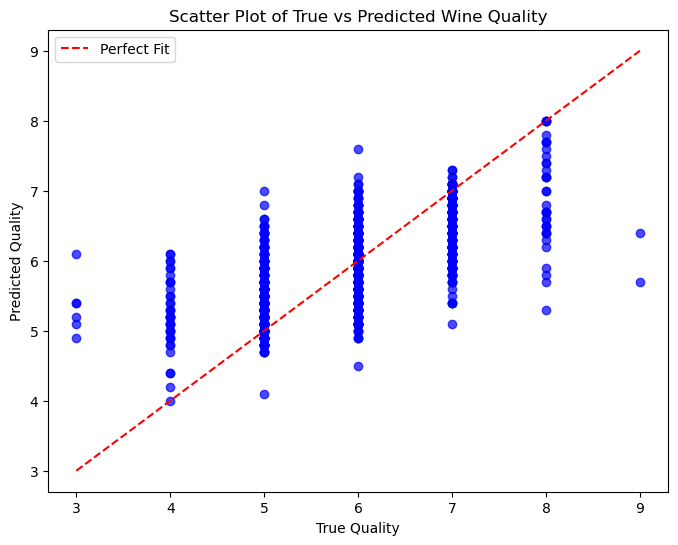

In [54]:
# Question 5 (c)


# Predict the quality for the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model's performance
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared: {r2:.2f}")

# Scatter plot of true vs predicted quality
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.7, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Fit')
plt.xlabel('True Quality')
plt.ylabel('Predicted Quality')
plt.title('Scatter Plot of True vs Predicted Wine Quality')
plt.legend()
plt.show()


In [ ]:

# The points are generally clustered around the diagonal line, 
# indicating that the model captures the trend of the data reasonably well.
# However there seems to be a tendency to underestimate higher quality wines and overestimate lower quality wines. 
# This is evident from the clustering of points below the perfect fit line for higher quality wines 
# and above the line for lower quality wines.
# MSE of 0.40 and R- Squared 0.47 suggest model is resonably accurate 









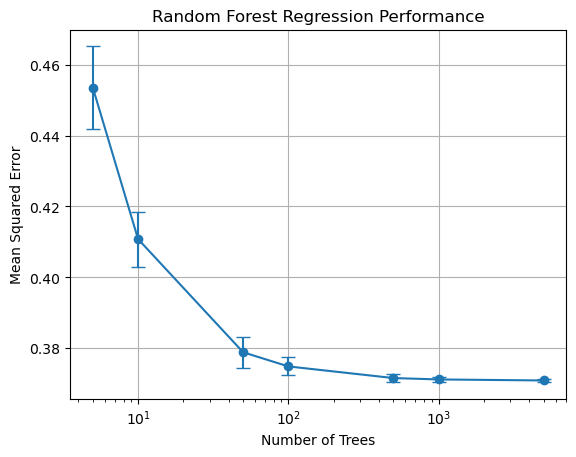

In [56]:
# Question 5 (d)

# Define a function to train and evaluate the model
def evaluate_rf(X_train, y_train, X_test, y_test, n_estimators):
    mse_scores = []
    for i in range(20):
        rf = RandomForestRegressor(n_estimators=n_estimators, random_state=i)
        rf.fit(X_train, y_train)
        y_pred = rf.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        mse_scores.append(mse)
    return np.mean(mse_scores), np.std(mse_scores)

# Define the number of trees to test
n_estimators_list = [5, 10, 50, 100, 500, 1000, 5000]

# Calculate performance for each number of trees
results = []
for n_estimators in n_estimators_list:
    mean_mse, std_mse = evaluate_rf(X_train, y_train, X_test, y_test, n_estimators)
    results.append((n_estimators, mean_mse, std_mse))

# Create a DataFrame to store the results
results_df = pd.DataFrame(results, columns=['n_estimators', 'mean_mse', 'std_mse'])



plt.errorbar(results_df['n_estimators'], results_df['mean_mse'], yerr=results_df['std_mse'], fmt='o-', capsize=5)
plt.xscale('log')
plt.xlabel('Number of Trees')
plt.ylabel('Mean Squared Error')
plt.title('Random Forest Regression Performance')
plt.grid(True)
plt.show()




In [ ]:


# As the number of trees increases, the mean squared error (MSE) decreases. 
# This indicates that the model's predictive accuracy improves with more trees.

# The most significant decrease in MSE occurs in the early stages, as the number of trees increases from 5 to 100. 
# This suggests that adding more trees initially leads to substantial improvements in the model's performance.

#  Beyond a certain point (around 100 trees ), the decrease in MSE becomes less pronounced. 
# This indicates that adding more trees beyond this point provides diminishing returns in terms of improved accuracy.



# Based on the plot, it appears that an optimal number of trees lies in the range of 100-500. 
# Beyond this point, while the model continues to improve, the marginal gains in accuracy are relatively small 
# compared to the increased computational cost.




In [ ]:
# Question 5 (e)



# To get a reliable estimate of the Random Forest model's performance and reduce the impact of 
# randomness in the training process, we train the model multiple times with different random seeds. 
# This approach provides several benefits:

# Reduced Bias: Averaging the results from multiple runs reduces bias.
# Improved Confidence: We can calculate standard errors and confidence intervals.
# Robustness Assessment: We can assess the model's sensitivity to random initialization.
# Optimal Hyperparameter Tuning: We can compare performance across different hyperparameter settings.
# More Reliable Performance Estimate: By considering the variability across multiple runs, 
# we obtain a more accurate and reliable estimate of the model's true performance.

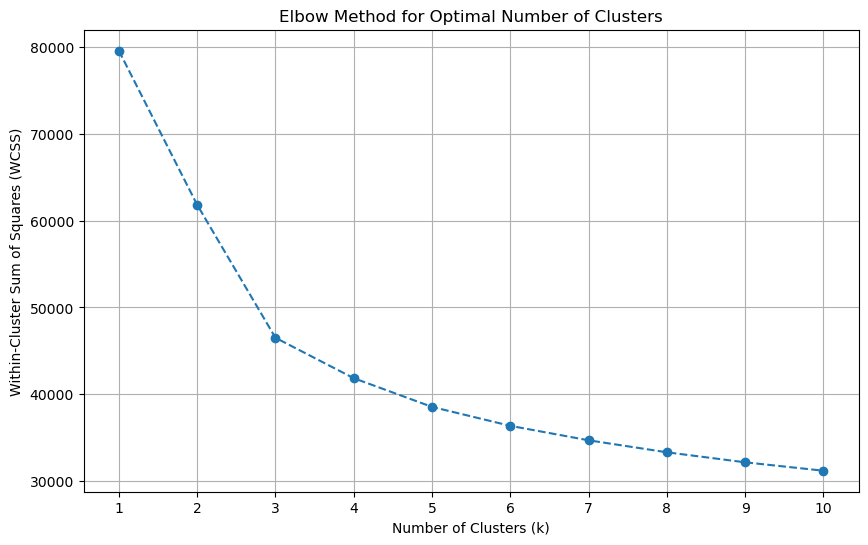

In [69]:
# Question 6 (a)

# Define the range for number of clusters
k_values = range(1, 11)

# Store the within-cluster sum of squares (WCSS) for each k
wcss = []

# Perform k-means clustering for each k and compute the WCSS
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled_df)
    wcss.append(kmeans.inertia_)

# Plot the WCSS values to identify the elbow point
plt.figure(figsize=(10, 6))
plt.plot(k_values, wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(k_values)
plt.grid()
plt.show()

In [ ]:
# Question 6 (a)

# The optimal number of clusters for this data appears to be around 4 or 5 clusters
# as at that point the rate of decrease in WCSS slows down indicating additional clusters will 
# not add that much improvement as the previous had,  diminishing returns.

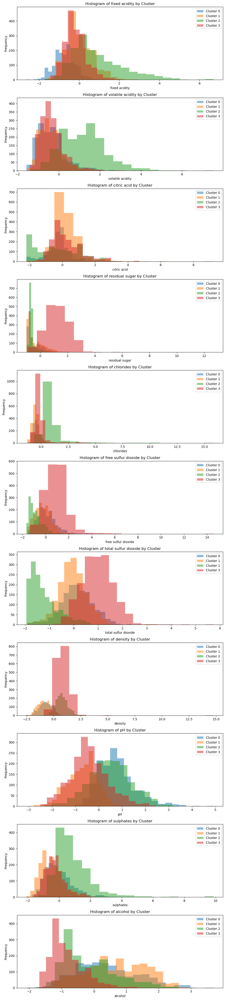

In [71]:
# Question 6 (b)


# Perform K-means clustering
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
X_scaled_df['Cluster'] = kmeans.fit_predict(X_scaled_df)

# Create histograms for each variable separated by cluster
variables = X_scaled_df.columns[:-1]  # Exclude the 'Cluster' column

# Set up the plotting area
num_vars = len(variables)
fig, axes = plt.subplots(nrows=num_vars, ncols=1, figsize=(10, num_vars * 4))

# Iterate through variables 
for i, var in enumerate(variables):
    for cluster in range(optimal_clusters):
        # Filter the data for the current cluster
        cluster_data = X_scaled_df[X_scaled_df['Cluster'] == cluster]
        axes[i].hist(cluster_data[var], bins=20, alpha=0.5, label=f'Cluster {cluster}')
    
    axes[i].set_title(f'Histogram of {var} by Cluster')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frequency')
    axes[i].legend()

plt.tight_layout()
plt.show()

In [ ]:


# Residual sugar and volatile accidity  appear to be the most discriminatory variables as 
# they show a distinct separation  of cluster 3 for residual sugar and cluster 2 
# for volatile accidity





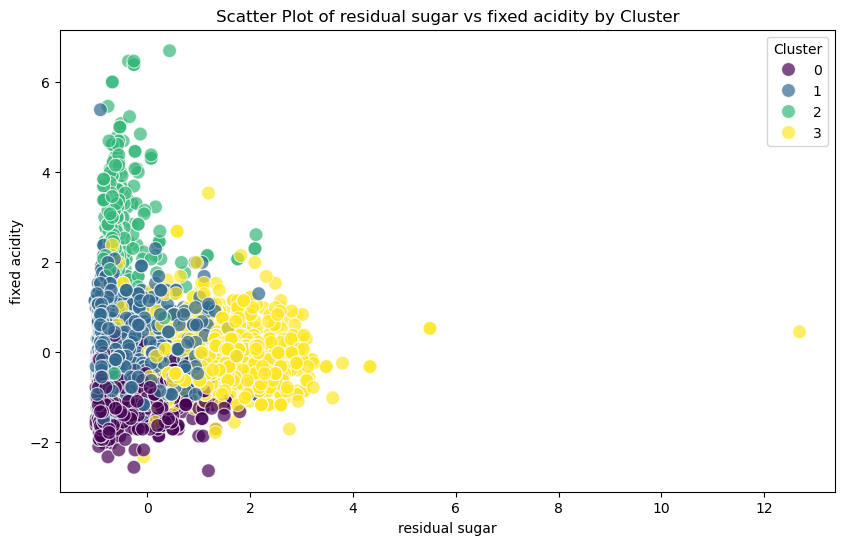

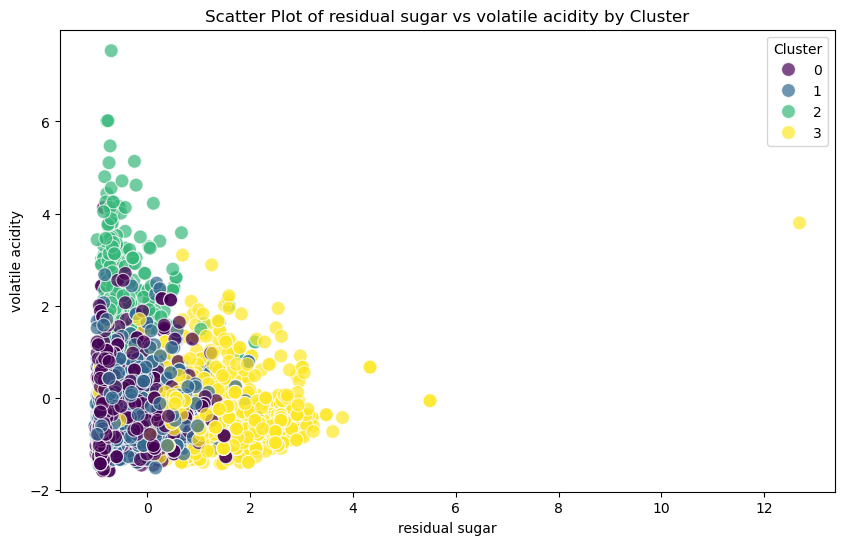

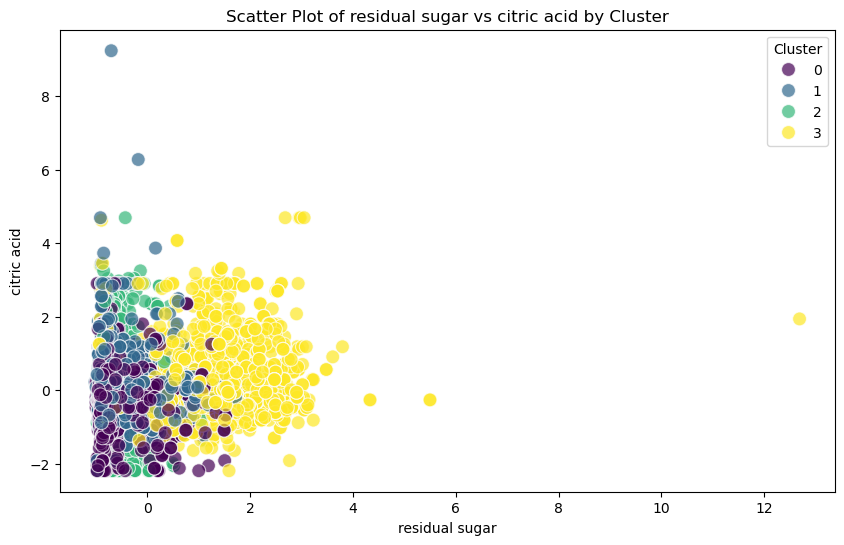

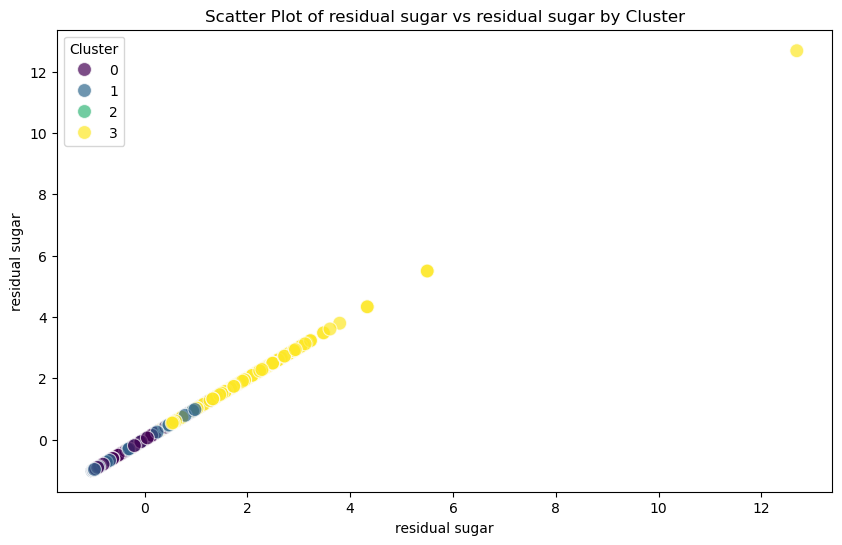

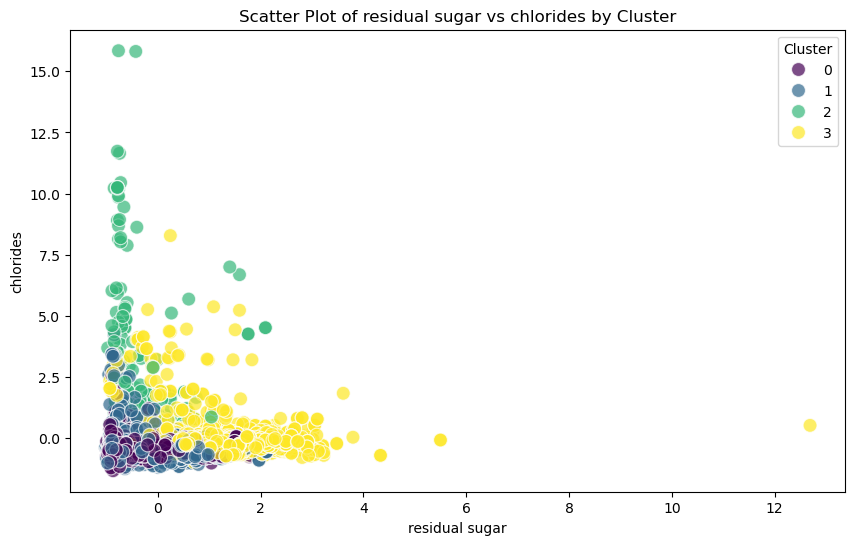

...

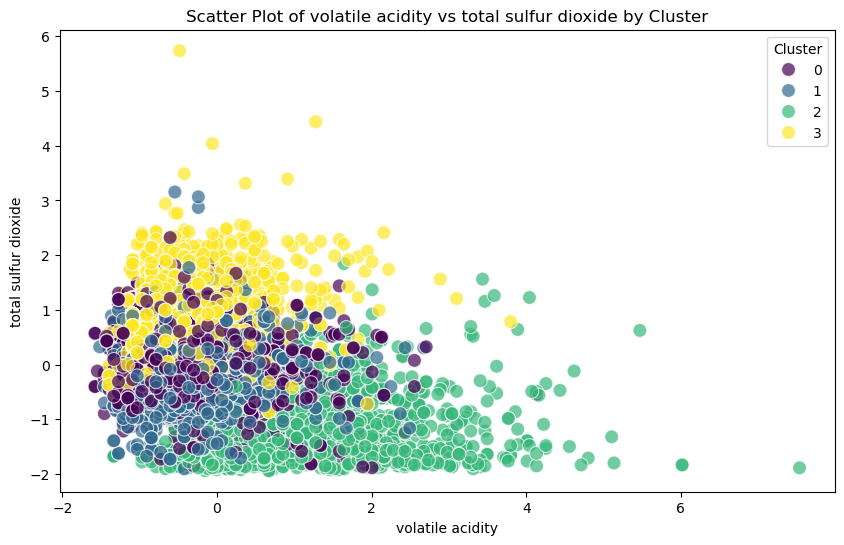

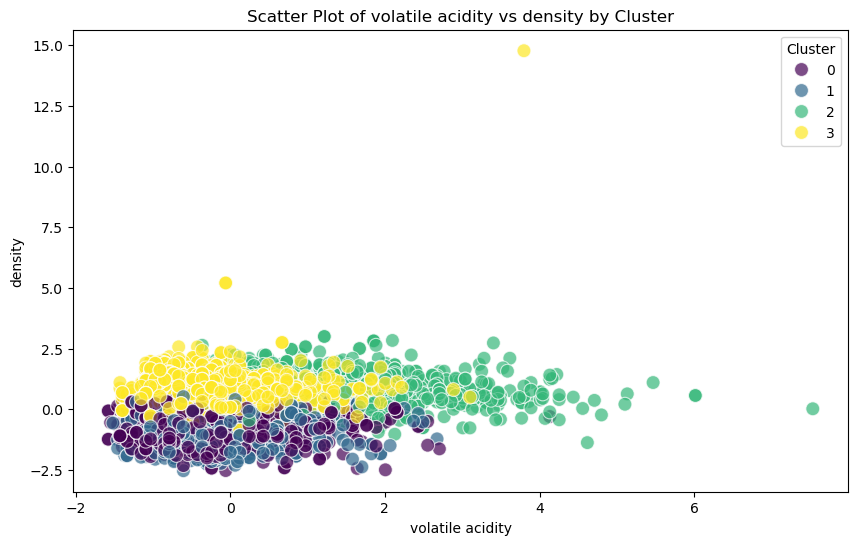

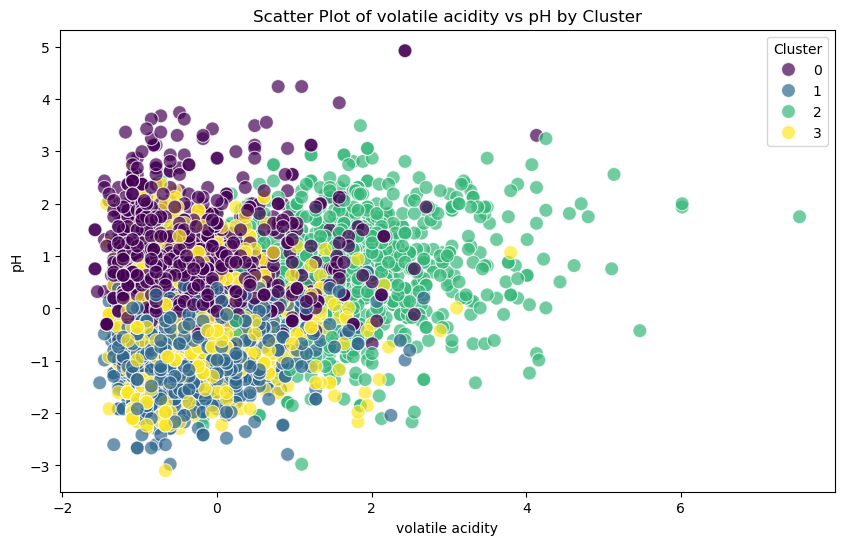

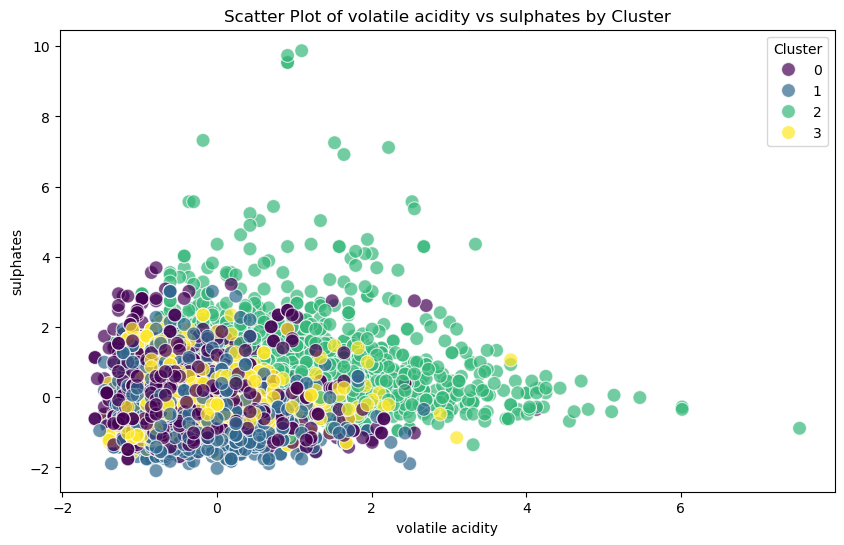

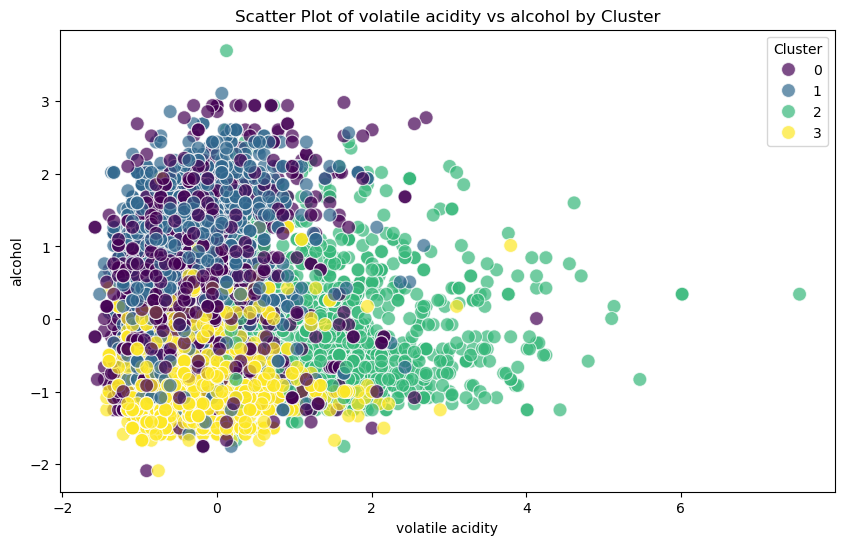

In [73]:

# Question 6 (c) 

# List of the most discriminatory variables
discriminatory_vars = ['residual sugar', 'volatile acidity']

# List of all other variables (excluding 'Cluster' column)
other_vars = [col for col in X_scaled_df.columns if col != 'Cluster']

# Create scatter plots of discriminatory variables against all other variables
for var in discriminatory_vars:
    for other_var in other_vars:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=X_scaled_df, x=var, y=other_var, hue='Cluster', palette='viridis', s=100, alpha=0.7)
        
        plt.title(f'Scatter Plot of {var} vs {other_var} by Cluster')
        plt.xlabel(var)
        plt.ylabel(other_var)
        plt.legend(title='Cluster')
        plt.show()



In [ ]:


# The scatterplots show that residual sugar and volatile acidity appear to be  effective discriminatory 
# variables for the k-means clustering of the wine samples. Whiile there is some overlapping of  clusters,  overall
# the clusters are  well-separated and defined.
# This  indicates  they can reliably differentiate between distinct groups of wines.
# Residual sugar appears to have an inverse relationship with volatile acidity, with higher residual sugar
# levels corresponding to lower volatile acidity, and vice versa. 
# Residual sugar and density appear to have a postive  realtionship, which makes sense as higher sugar 
# content contributes to greater liquid density.
# Cluster-level analysis of these variables may help give insights on the qualities or styles of the different 
# wine sample groupings.For example: 

# Residual sugar :  when comparing  cluster 3 (the yellow group) to the other clusters , it  appears 
# to have high residual sugar, low volatile acidity, medium to low fixed acidity, 
# medium to high citric acid, medium to high free sulfur dioxide, high total sulfur dioxide, 
# high density and medium pH.

# Low volatile acidity is a positive indicator of wine quality, as higher levels can result in off-flavors.
# Sulfur dioxide is used in preervation of wine (more is used in white wine), so high levels could mean this is a wine thats meant to 
# have an extended shelf life, exported or be stored. Vinho Verde whites are known for their  fresh and citrusy character
# and this cluster has medium to high citiric acid and along with the fixed acidity could help balnce the sweetness. 
# Medium pH reinforces this as the wine is balnced between acidic and smooth. This cluster could represent high quality Vinho
# Verde whites that are approacble, easy drinking and perfect for export. 
   





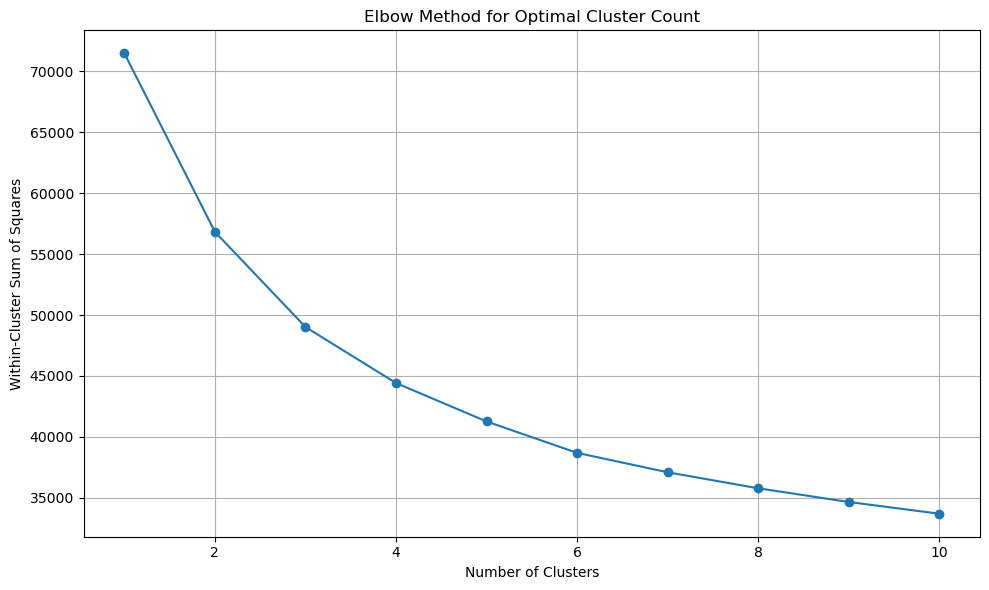

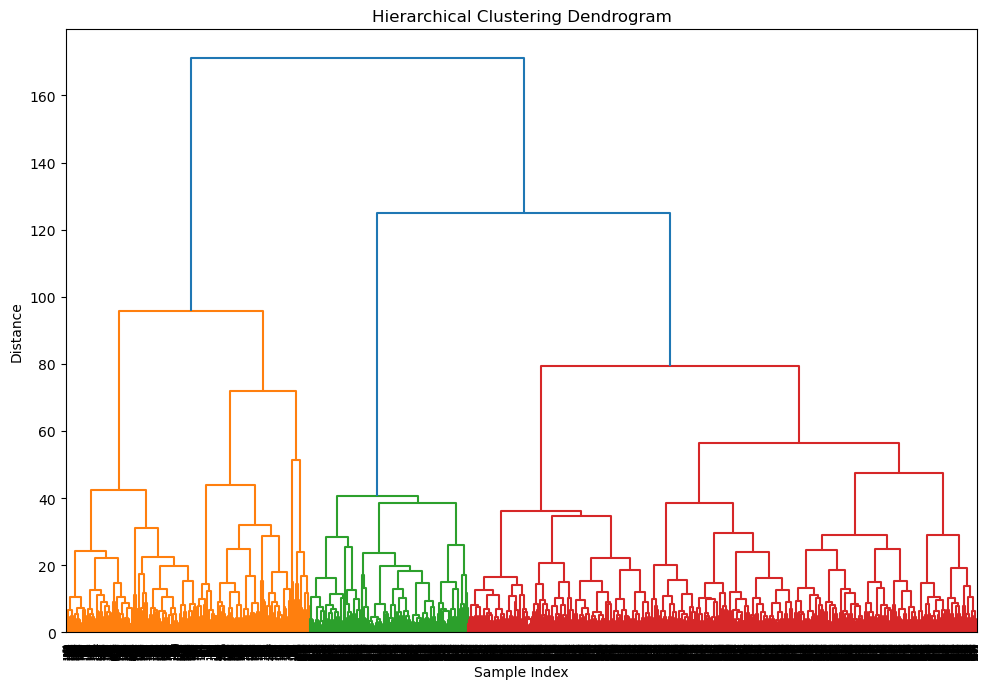

In [81]:
# Question 6 (d)

# I will use  Agglomerative clustering to analyse the data further. 
# Agglomerative clustering is a type of hierarchical clustering algorithm that works by initially 
# treating each data point as its own cluster, and then iteratively merging the two closest clusters 
# until all data points belong to a single cluster. The dendrogram shows the hierarchical relationships
# between the clusters.

# make a copy of standardised  data that will have an agglomarotive cluster column 
X_scaled_2 = X_scaled_df.copy()

# The plot_elbow_curve function is used to determine the optimal number of clusters.   
def plot_elbow_curve(X, max_clusters=10):
    inertias = []
    for n_clusters in range(1, max_clusters + 1):
        clustering = AgglomerativeClustering(n_clusters=n_clusters)
        clustering.fit(X)
        
        # Convert to NumPy array to avoid FutureWarning
        X_array = X.values if hasattr(X, 'values') else X
        
        inertia = 0
        for cluster in range(n_clusters):
            cluster_points = X_array[clustering.labels_ == cluster]
            cluster_center = cluster_points.mean(axis=0)
            inertia += np.sum((cluster_points - cluster_center) ** 2)
        
        inertias.append(inertia)
    
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, max_clusters + 1), inertias, marker='o')
    plt.title('Elbow Method for Optimal Cluster Count')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Within-Cluster Sum of Squares')
    plt.tight_layout()
    plt.grid()
    plt.show()

# The plot_dendrogram function visualizes the hierarchical structure of the clusters using a dendrogram. 
def plot_dendrogram(X):
    # Convert to NumPy array if needed
    X_array = X.values if hasattr(X, 'values') else X
    
    linkage_matrix = linkage(X_array, method='ward')
    
    plt.figure(figsize=(10, 7))
    dendrogram(linkage_matrix)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Sample Index')
    plt.ylabel('Distance')
    plt.tight_layout()
    plt.show()

# Choose number of clusters based on elbow plot
n_clusters = 4  # Modify based on elbow curve

# Perform clustering
clustering = AgglomerativeClustering(n_clusters=n_clusters)
cluster_labels = clustering.fit_predict(X_scaled_2)

# Add cluster column to DataFrame
X_scaled_2['Cluster'] = cluster_labels

# Perform visualization
plot_elbow_curve(X_scaled_2.drop('Cluster', axis=1))
plot_dendrogram(X_scaled_2.drop('Cluster', axis=1))

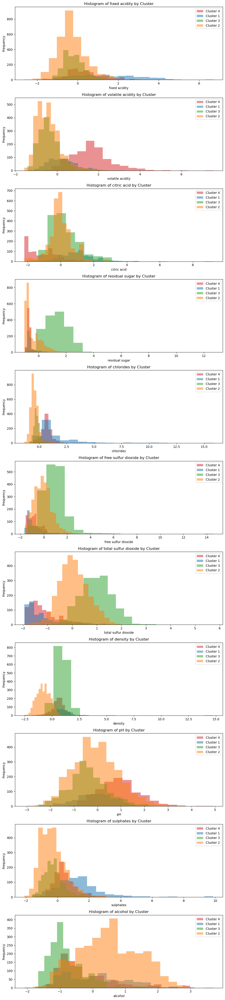

In [87]:

# Assign cluster labels
cluster_labels = clustering.fit_predict(X_scaled_2)
X_scaled_2['Cluster'] = cluster_labels

# Set up the plotting area
variables2 = X_scaled_2.columns[:-1]  # Exclude the 'Cluster' column
num_vars2 = len(variables2)
fig, axes = plt.subplots(nrows=num_vars, ncols=1, figsize=(10, num_vars * 4))

# Define the color palette
palette = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']

for i, var in enumerate(variables):
    for cluster in X_scaled_2['Cluster'].unique():
        # Filter the data for the current cluster
        cluster_data = X_scaled_2[X_scaled_2['Cluster'] == cluster]
        axes[i].hist(cluster_data[var], bins=20, alpha=0.5, color=palette[int(cluster)], label=f'Cluster {int(cluster)+1}')
    
    axes[i].set_title(f'Histogram of {var} by Cluster')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frequency')
    axes[i].legend()

plt.tight_layout()
plt.show()

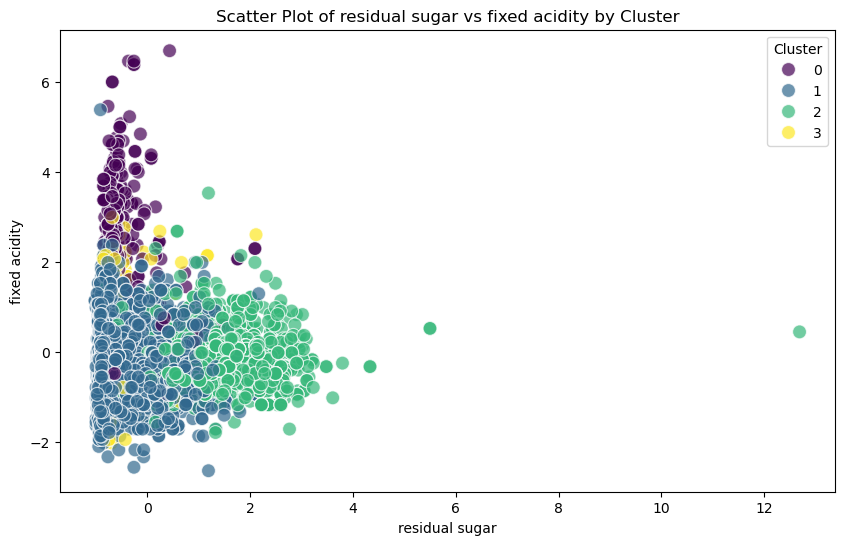

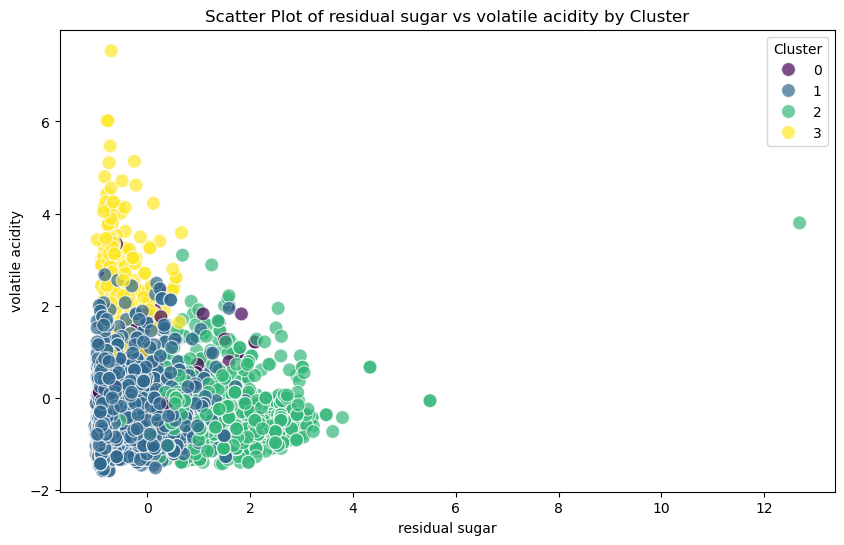

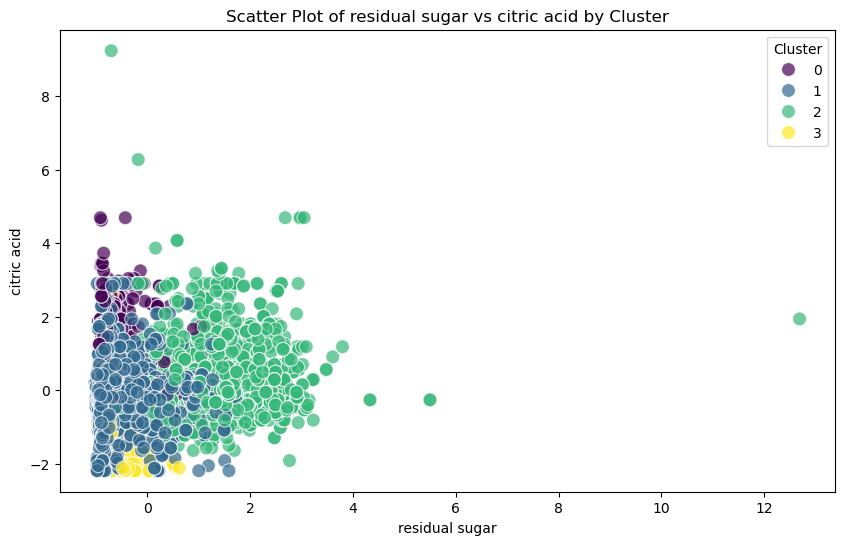

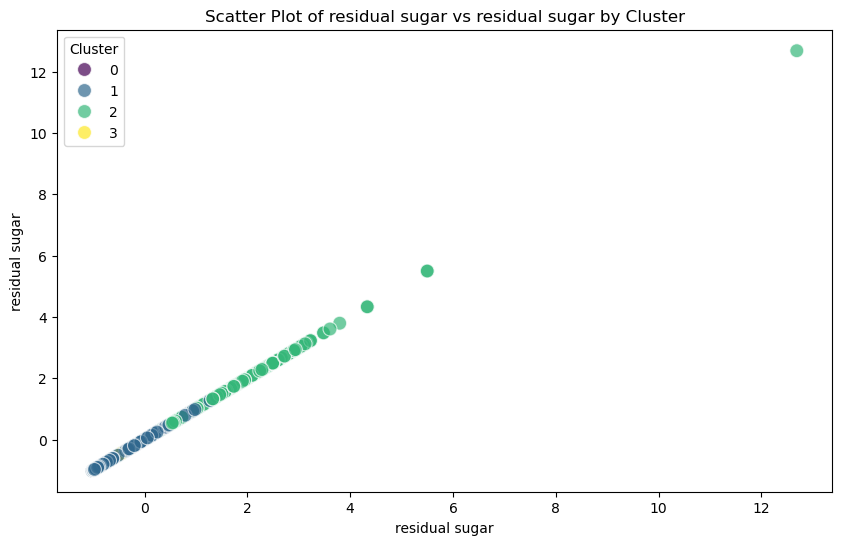

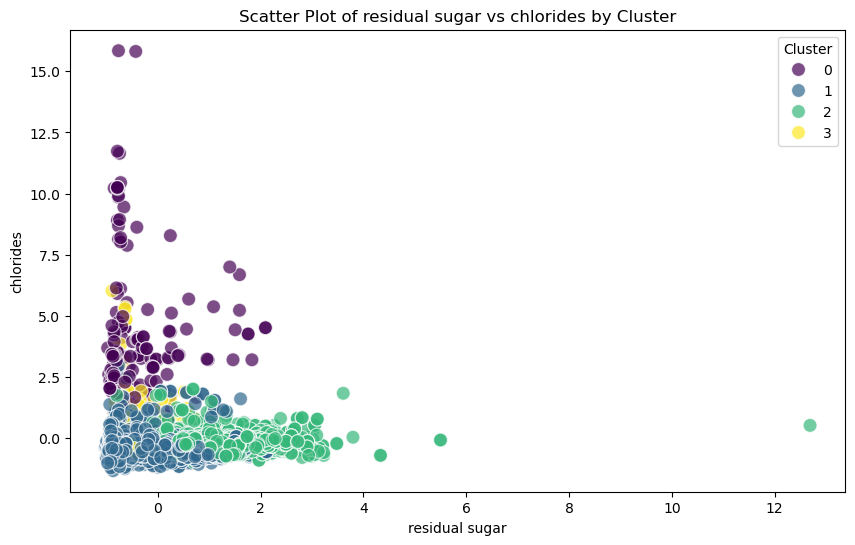

...

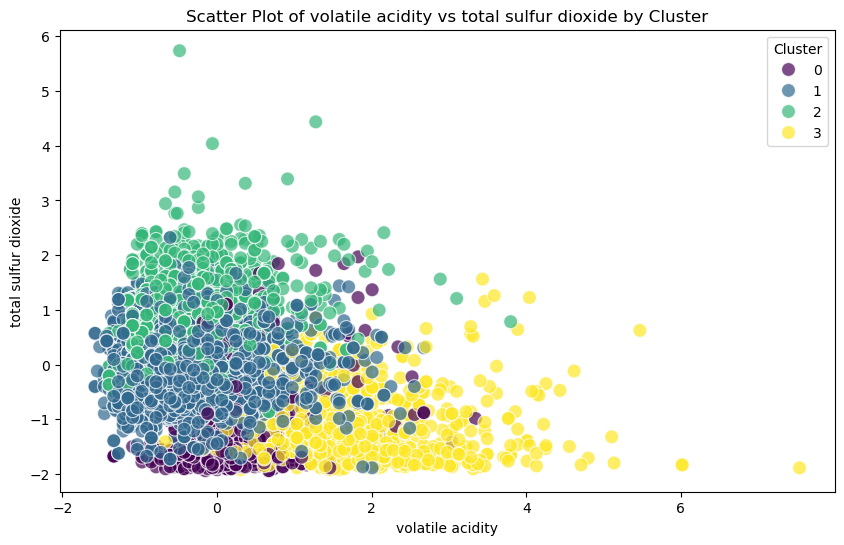

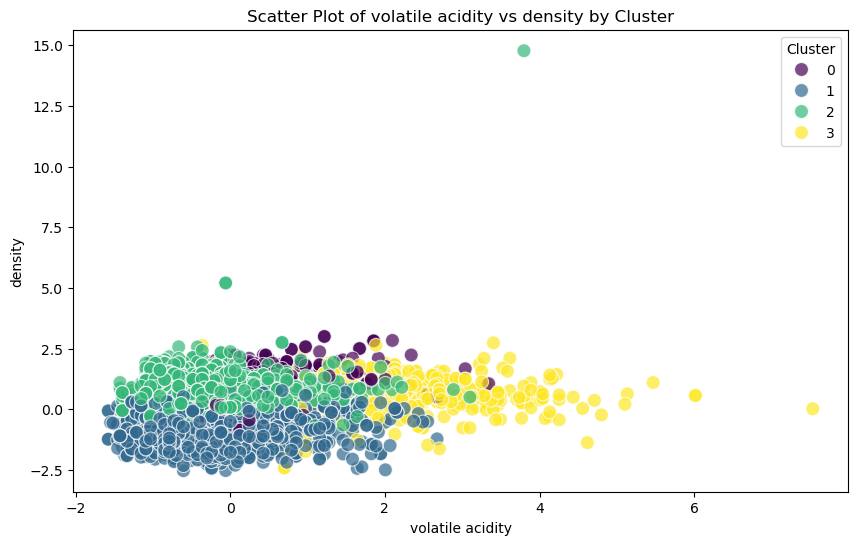

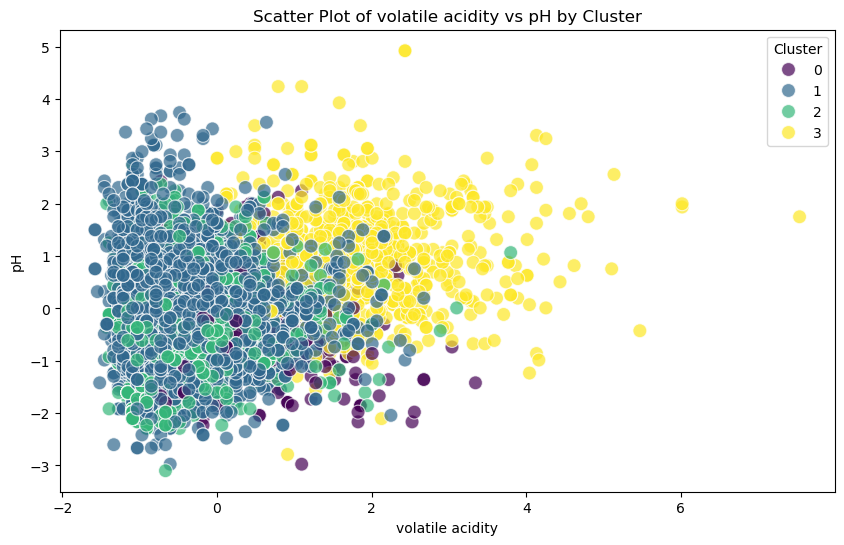

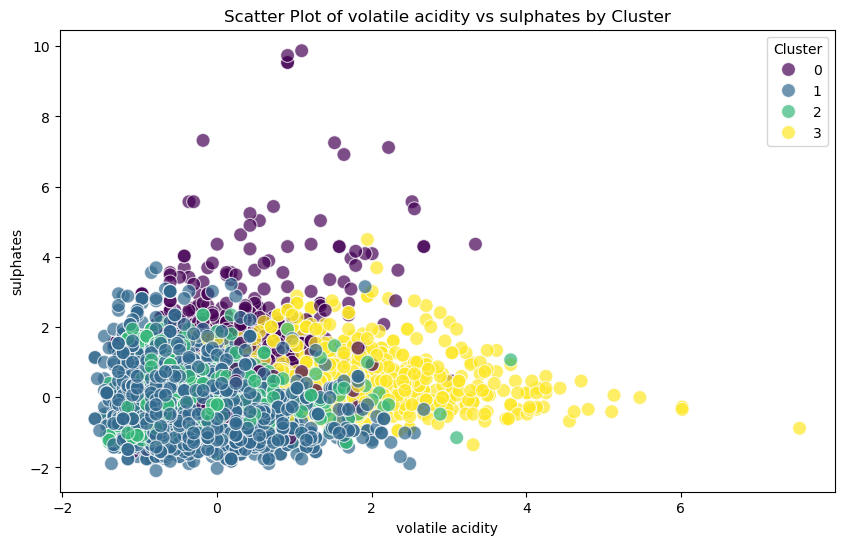

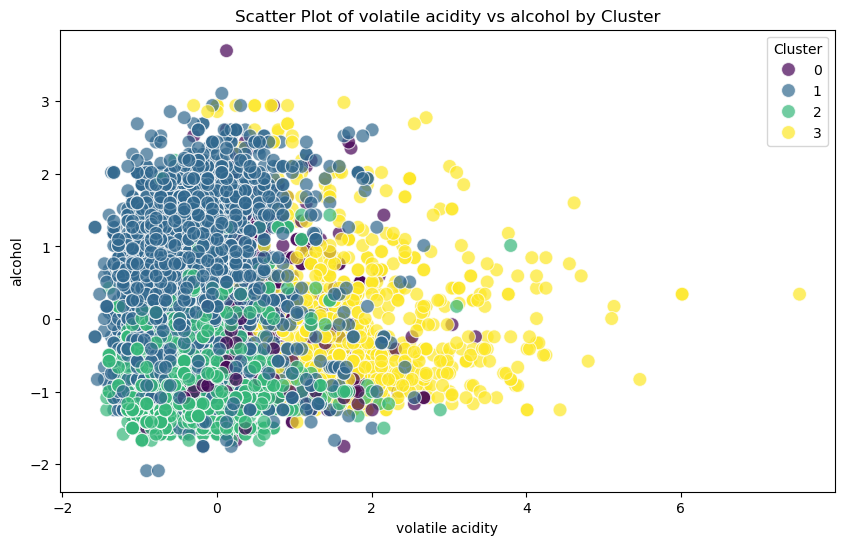

In [89]:


# List of the most discriminatory variables
discriminatory_vars2 = ['residual sugar', 'volatile acidity']

# List of all other variables (excluding 'Cluster' column)
other_vars2 = [col for col in X_scaled_2.columns if col != 'Cluster']

# Create scatter plots of discriminatory variables against all other variables
for var in discriminatory_vars2:
    for other_var in other_vars2:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=X_scaled_2, x=var, y=other_var, hue='Cluster', palette='viridis', s=100, alpha=0.7)
        
        plt.title(f'Scatter Plot of {var} vs {other_var} by Cluster')
        plt.xlabel(var)
        plt.ylabel(other_var)
        plt.legend(title='Cluster')
        plt.show()




In [ ]:
 # The agglomerative cluster analysis appears to back up the K means clustering anaysis.
# With  the optimal number of clusters being around between 4 - 6, and volatile acididty and residual sugar 
# being discrimnaotry variables. The scatterplots also show very similar groupings of clusters 
# for the discrimantory variables using both methods. The k means cluster anaysis clusters 
# appear to be slightly better defined so perhaps it would be the better method to use



In [ ]:


# I confirm that all work submitted is my own and that I have neither given, sought, 
# nor received aid in relation to this assignment.
